# This is 2odor nb yet to be adapted for 4odor

In [265]:
# all modules necessary for this nb
import os
import sys
import pickle
import math

import numpy as np
import pylab as pl
import scipy.stats as sstats

# setting parameters for default matplotlib plots
%matplotlib inline

In [266]:
pl.style.use('fabiostyle')
# needs to find the library of functions
sys.path.append('../../code/')  # to be replaced!

import utils as ut
import plots as pt

In [267]:
# NOTEBOOK_NAME = NOTEBOOK_NAME.split('/')[-1][:-6]
NOTEBOOK_NAME = 'heatmaps_FIGURES'

In [268]:
from pickleshare import PickleShareDB

autorestore_folder = os.path.join(os.getcwd(), 'autorestore', NOTEBOOK_NAME)
db = PickleShareDB(autorestore_folder)
import sys
from workspace import *
import IPython
ip = IPython.get_ipython()

# this will restore all the saved variables. ignore the errors listed.
load_workspace(ip, db)

# use `save_worspace(db)` to save variables at the end

In [5]:
from itertools import product
def load_all_animals_vars(varname, animal_list, pilot_list=None, notebook='preprocessing'):
    all_of_them = {}
    for ani in animal_list:
        folder = '../%s/notebooks/autorestore/%s/' % (ani, notebook)
        all_of_them.update({ani: ut.load_variable(varname, folder)})
    return all_of_them

In [6]:
sessions = 'expo', 'pre','d2', 'post','ext1','ext2','renew'

In [116]:
#import event magnitude data
for sess in sessions:
    for tt in ('CSm','Rew'):
        for reg in 'dhpc','vhpc':
            exec("all_%s_%s_evs_%s = ut.load_variable('all_%s_%s_evs','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,reg,sess,tt,reg))

for epoch,s,e in zip(['CS','tr','US','longUS'],[1.0,3.0,5.0,5.0],[2.0,4.0,6.0,9.0]):
    for tt in ['CSm','Rew']:
        for sess in sessions:
            for reg in 'dhpc','vhpc':
                exec("%s_%s_%s_evs_%s = ut.load_variable('%s_%s_%s_evs','../notebooks/autorestore/heatmaps_%s_JSB/')"%(epoch,sess,tt,reg,epoch,sess,tt,reg))

In [117]:
#import event trace duration data
for sess in sessions:
    for tt in ('CSm','Rew'):
        for reg in 'dhpc','vhpc':
            exec("zs_durations_%s_%s_raw_%s = ut.load_variable('zs_durations_%s_%s_raw','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,reg,sess,tt,reg))

In [126]:
#import event trace duration data
for sess in sessions:
    for tt in ('CSm','Rew'):
        for reg in 'dhpc','vhpc':
            for epoch in 'baseline','trial':
                exec("zs_durations_%s_%s_%s_rawB_%s = ut.load_variable('zs_durations_%s_%s_%s_rawB','../notebooks/autorestore/heatmaps_%s_JSB/')"%(epoch,sess,tt,reg,epoch,sess,tt,reg))

In [118]:
#import event trace max amplitude data
for sess in sessions:
    for tt in ('CSm','Rew'):
        for reg in 'dhpc','vhpc':
            exec("zs_maxval_%s_%s_raw_%s = ut.load_variable('zs_maxval_%s_%s_raw','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,reg,sess,tt,reg))

In [119]:
#import data for heatmaps
for sess in sessions:
    for tt in ('CSm','Rew'):
        for reg in 'dhpc','vhpc':
            exec("all_hms_%s_%s_evs_%s = ut.load_variable('all_hms_%s_%s_evs','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,reg,sess,tt,reg))
            exec("all_hms_%s_%s_traces_%s = ut.load_variable('all_hms_%s_%s_traces','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,reg,sess,tt,reg))
            exec("sort_%s_%s_evs_%s = ut.load_variable('sort_%s_%s_evs','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,reg,sess,tt,reg))
            exec("sort_%s_%s_traces_%s = ut.load_variable('sort_%s_%s_traces','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,reg,sess,tt,reg))
            for eo in 'even','odd':
                exec("all_hms_%s_%s_evs_%s_%s = ut.load_variable('all_hms_%s_%s_evs_%s','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,eo,reg,sess,tt,eo,reg))
                exec("all_hms_%s_%s_traces_%s_%s = ut.load_variable('all_hms_%s_%s_traces_%s','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,eo,reg,sess,tt,eo,reg))
                exec("sort_%s_%s_evs_%s_%s = ut.load_variable('sort_%s_%s_evs_%s','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,eo,reg,sess,tt,eo,reg))
                exec("sort_%s_%s_traces_%s_%s = ut.load_variable('sort_%s_%s_traces_%s','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,eo,reg,sess,tt,eo,reg))

In [112]:
for sess in sessions:
    for reg in 'dhpc','vhpc':
        exec("min_time_ax_single_%s_%s = ut.load_variable('min_time_ax_single_%s','../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,reg,sess,reg))

In [218]:
#import data for duration heatmaps
for sess in sessions:
    for tt in ('CSm','Rew'):
        for signal in 'baseline','trial':
            for reg in 'dhpc','vhpc':
                exec("odd_peak_even_PETH_%s_%s_evs_%s_%s = ut.load_variable('odd_peak_even_PETH_%s_%s_evs_%s',\
                     '../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,signal,reg,sess,tt,signal,reg))
                exec("odd_peak_even_PETH_%s_%s_evs_normed_%s_%s = ut.load_variable('odd_peak_even_PETH_%s_%s_evs_%s_normed',\
                     '../notebooks/autorestore/heatmaps_%s_JSB/')"%(sess,tt,signal,reg,sess,tt,signal,reg))

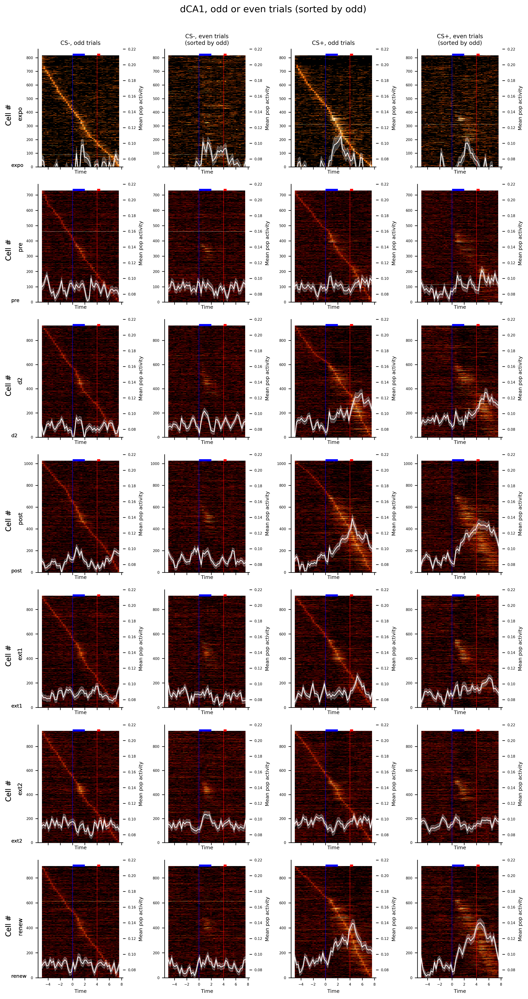

In [104]:
fig, axs = pl.subplots(len(sessions), 4, figsize=(10, np.ceil(all_hms_pre_CSm_evs_dhpc.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,eo,z in zip(['CSm','CSm','Rew','Rew'],['odd','even','odd','even'],range(4)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_dhpc[0]"%sess), eval("min_time_ax_single_%s_dhpc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_evs_dhpc"%(sess,tt)))),vmin=0, vmax=1, cmap='afmhot')

        func(axs[i][z], eval("all_hms_%s_%s_evs_%s_dhpc[sort_%s_%s_evs_odd_dhpc]"%(sess,tt,eo,sess,tt)))
        axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][z].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_evs_dhpc"%sess)), color=['b','r'], lw=.5)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs_dhpc"%sess))+5, 0, 2, color='b', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs_dhpc"%sess))+5, 4, 4.5, color='r', lw=3)
        axs[i][0].text(-9,len(eval("all_hms_%s_CSm_evs_dhpc"%sess))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-11,len(eval("all_hms_%s_CSm_evs_dhpc"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        twin_ax.plot(eval("min_time_ax_single_%s_dhpc"%sess),eval("all_hms_%s_%s_evs_%s_dhpc.mean(0)"%(sess,tt,eo)),color='w',lw=1)
        m = eval("all_hms_%s_%s_evs_%s_dhpc.mean(0)"%(sess,tt,eo))
        sem = eval("all_hms_%s_%s_evs_%s_dhpc.std(0)/(math.sqrt(len(all_hms_%s_%s_evs_%s_dhpc)))"%(sess,tt,eo,sess,tt,eo))
        twin_ax.fill_between(eval("min_time_ax_single_%s_dhpc"%sess),m-sem,m+sem,alpha=0.25,color='w',linewidth=1)
        twin_ax.set_ylim(0.07,.22)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-, odd trials', fontsize=8)
axs[0][1].set_title('CS-, even trials\n(sorted by odd)', fontsize=8)
axs[0][2].set_title('CS+, odd trials', fontsize=8)
axs[0][3].set_title('CS+, even trials\n(sorted by odd)', fontsize=8)

fig.suptitle("dCA1, odd or even trials (sorted by odd)", fontsize=13, y=1.02)
fig.tight_layout()
fig.savefig('../final-ish figures/%s_sorted_event_heatmaps_EO_dhpc.pdf'%(NOTEBOOK_NAME))

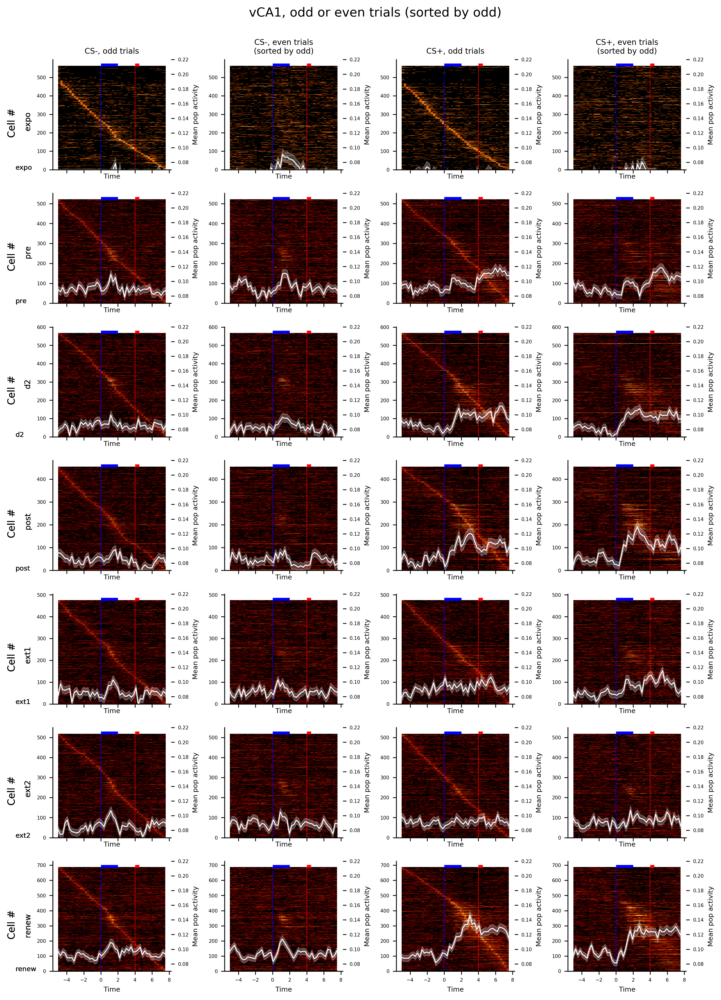

In [105]:
fig, axs = pl.subplots(len(sessions), 4, figsize=(10, np.ceil(all_hms_pre_CSm_evs_vhpc.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,eo,z in zip(['CSm','CSm','Rew','Rew'],['odd','even','odd','even'],range(4)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_vhpc[0]"%sess), eval("min_time_ax_single_%s_vhpc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_evs_vhpc"%(sess,tt)))),vmin=0, vmax=1, cmap='afmhot')

        func(axs[i][z], eval("all_hms_%s_%s_evs_%s_vhpc[sort_%s_%s_evs_odd_vhpc]"%(sess,tt,eo,sess,tt)))
        axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][z].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_evs_vhpc"%sess)), color=['b','r'], lw=.5)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs_vhpc"%sess))+5, 0, 2, color='b', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs_vhpc"%sess))+5, 4, 4.5, color='r', lw=3)
        axs[i][0].text(-9,len(eval("all_hms_%s_CSm_evs_vhpc"%sess))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-11,len(eval("all_hms_%s_CSm_evs_vhpc"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        twin_ax.plot(eval("min_time_ax_single_%s_vhpc"%sess),eval("all_hms_%s_%s_evs_%s_vhpc.mean(0)"%(sess,tt,eo)),color='w',lw=1)
        m = eval("all_hms_%s_%s_evs_%s_vhpc.mean(0)"%(sess,tt,eo))
        sem = eval("all_hms_%s_%s_evs_%s_vhpc.std(0)/(math.sqrt(len(all_hms_%s_%s_evs_%s_vhpc)))"%(sess,tt,eo,sess,tt,eo))
        twin_ax.fill_between(eval("min_time_ax_single_%s_vhpc"%sess),m-sem,m+sem,alpha=0.25,color='w',linewidth=1)
        twin_ax.set_ylim(0.07,.22)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-, odd trials', fontsize=8)
axs[0][1].set_title('CS-, even trials\n(sorted by odd)', fontsize=8)
axs[0][2].set_title('CS+, odd trials', fontsize=8)
axs[0][3].set_title('CS+, even trials\n(sorted by odd)', fontsize=8)

fig.suptitle("vCA1, odd or even trials (sorted by odd)", fontsize=13, y=1.02)
fig.tight_layout()
fig.savefig('../final-ish figures/%s_sorted_event_heatmaps_EO_vhpc.pdf'%(NOTEBOOK_NAME))

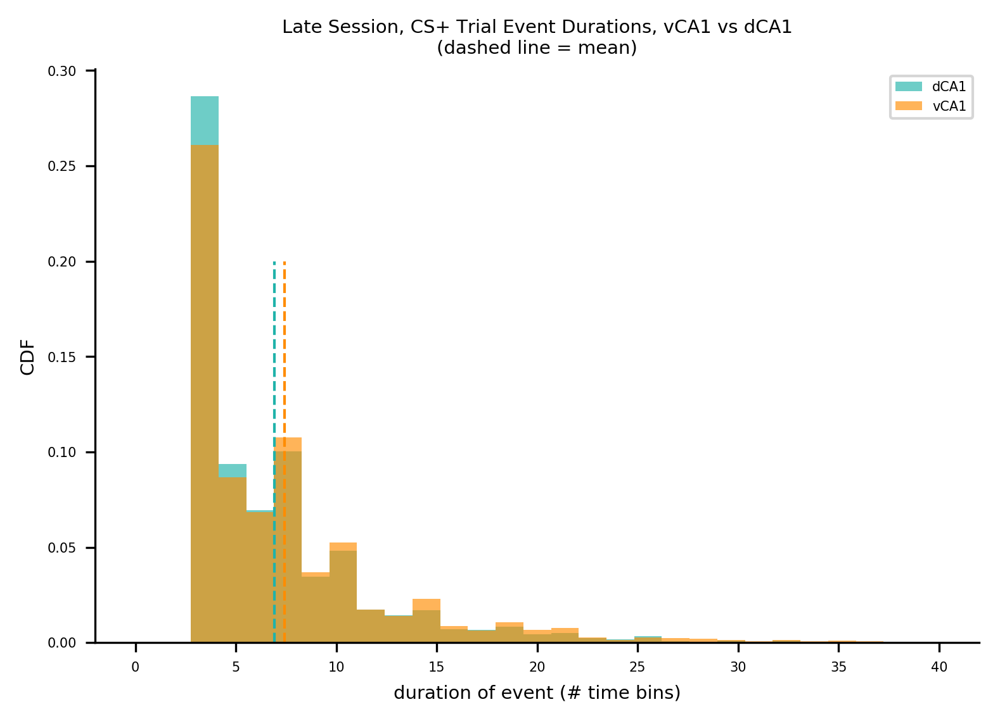

In [143]:
bins = np.linspace(0, 40, 30)

pl.hist(zs_durations_post_Rew_raw_dhpc,bins,cumulative=False,normed=True,color='lightseagreen',alpha=.65,label='dCA1')
pl.hist(zs_durations_post_Rew_raw_vhpc,bins,cumulative=False,normed=True,color='darkorange',alpha=.65,label='vCA1')
#pl.ylim(0,1)
# draw vertical line from (70,100) to (70, 250)
pl.plot([np.mean(zs_durations_post_Rew_raw_dhpc),np.mean(zs_durations_post_Rew_raw_dhpc)], [0,.2], 'lightseagreen', lw=1,ls='--')
pl.plot([np.mean(zs_durations_post_Rew_raw_vhpc),np.mean(zs_durations_post_Rew_raw_vhpc)], [0,.2], 'darkorange', lw=1,ls='--')


pl.xlabel("duration of event (# time bins)")
pl.ylabel("CDF")
pl.title("Late Session, CS+ Trial Event Durations, vCA1 vs dCA1\n(dashed line = mean)")
pl.legend()
pl.show()

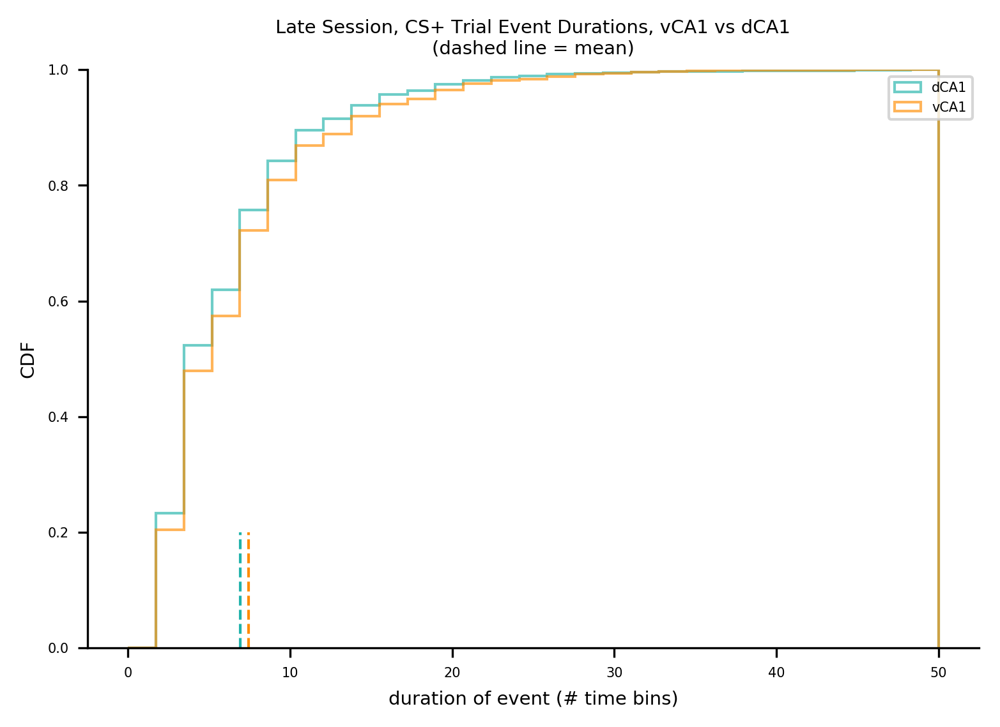

In [72]:
bins = np.linspace(0, 50, 30)

pl.hist(zs_durations_post_Rew_raw_dhpc,bins,cumulative=True,normed=True,color='lightseagreen',alpha=.65,histtype='step',label='dCA1')
pl.hist(zs_durations_post_Rew_raw_vhpc,bins,cumulative=True,normed=True,color='darkorange',alpha=.65,histtype='step',label='vCA1')
pl.ylim(0,1)
# draw vertical line from (70,100) to (70, 250)
pl.plot([np.mean(zs_durations_post_Rew_raw_dhpc),np.mean(zs_durations_post_Rew_raw_dhpc)], [0,.2], 'lightseagreen', lw=1,ls='--')
pl.plot([np.mean(zs_durations_post_Rew_raw_vhpc),np.mean(zs_durations_post_Rew_raw_vhpc)], [0,.2], 'darkorange', lw=1,ls='--')


pl.xlabel("duration of event (# time bins)")
pl.ylabel("CDF")
pl.title("Late Session, CS+ Trial Event Durations, vCA1 vs dCA1\n(dashed line = mean)")
pl.legend()
pl.show()

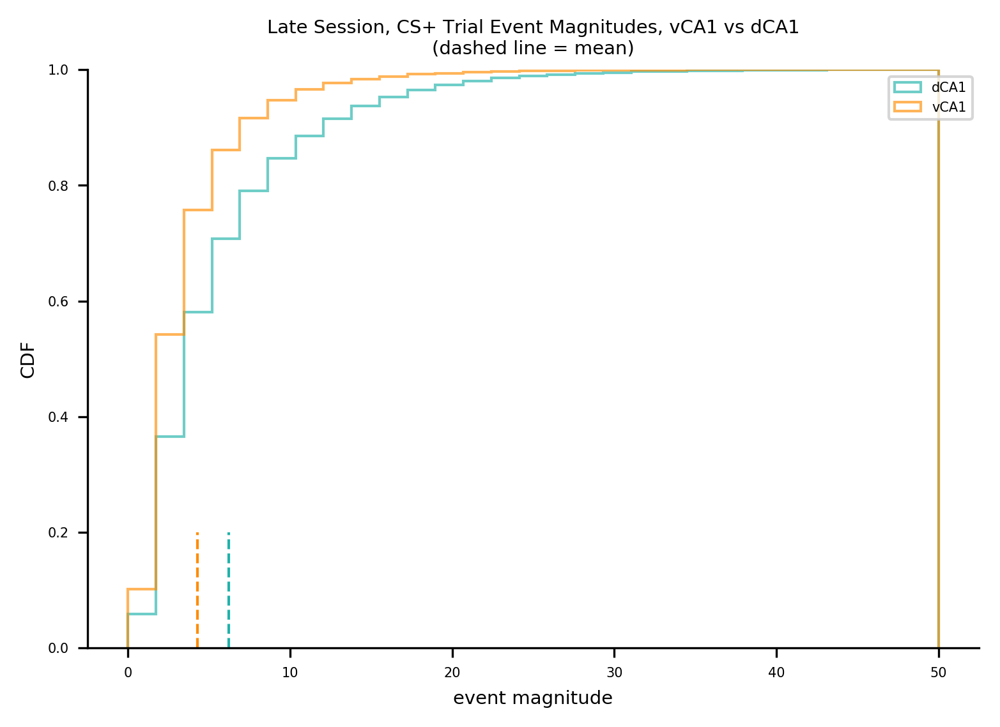

In [75]:
bins = np.linspace(0, 50, 30)

pl.hist(all_post_Rew_evs_dhpc,bins,cumulative=True,normed=True,color='lightseagreen',alpha=.65,histtype='step',label='dCA1')
pl.hist(all_post_Rew_evs_vhpc,bins,cumulative=True,normed=True,color='darkorange',alpha=.65,histtype='step',label='vCA1')
pl.ylim(0,1)
# draw vertical line from (70,100) to (70, 250)
pl.plot([np.mean(all_post_Rew_evs_dhpc),np.mean(all_post_Rew_evs_dhpc)], [0,.2], 'lightseagreen', lw=1,ls='--')
pl.plot([np.mean(all_post_Rew_evs_vhpc),np.mean(all_post_Rew_evs_vhpc)], [0,.2], 'darkorange', lw=1,ls='--')


pl.xlabel("event magnitude")
pl.ylabel("CDF")
pl.title("Late Session, CS+ Trial Event Magnitudes, vCA1 vs dCA1\n(dashed line = mean)")
pl.legend()
pl.show()

In [128]:
for sess in sessions:
    for tt in ('CSm','Rew'):
        for epoch in 'baseline','trial':
            for reg in 'dhpc','vhpc':
                print sess,tt,epoch,reg,'mean:',
                print np.mean(eval("zs_durations_%s_%s_%s_rawB_%s"%(epoch,sess,tt,reg))), '    StDev:',
                print np.std(eval("zs_durations_%s_%s_%s_rawB_%s"%(epoch,sess,tt,reg)))

expo CSm baseline dhpc mean: 13.189784236     StDev: 13.0063528662
expo CSm baseline vhpc mean: 10.4015331747     StDev: 11.6964546018
expo CSm trial dhpc mean: 10.5866881374     StDev: 7.92543585401
expo CSm trial vhpc mean: 9.92277657267     StDev: 9.23487810616
expo Rew baseline dhpc mean: 12.3137502632     StDev: 12.243635672
expo Rew baseline vhpc mean: 10.5613256785     StDev: 11.9050215329
expo Rew trial dhpc mean: 10.4801945796     StDev: 7.86043503109
expo Rew trial vhpc mean: 10.0358862144     StDev: 9.20053887991
pre CSm baseline dhpc mean: 10.4815434965     StDev: 10.4166941801
pre CSm baseline vhpc mean: 11.6207410351     StDev: 12.0308780787
pre CSm trial dhpc mean: 8.52651664693     StDev: 6.53640746651
pre CSm trial vhpc mean: 9.67635990421     StDev: 7.5236049218
pre Rew baseline dhpc mean: 10.2520490262     StDev: 10.3622235666
pre Rew baseline vhpc mean: 11.808328292     StDev: 12.074500838
pre Rew trial dhpc mean: 8.57477313975     StDev: 6.45967565614
pre Rew trial

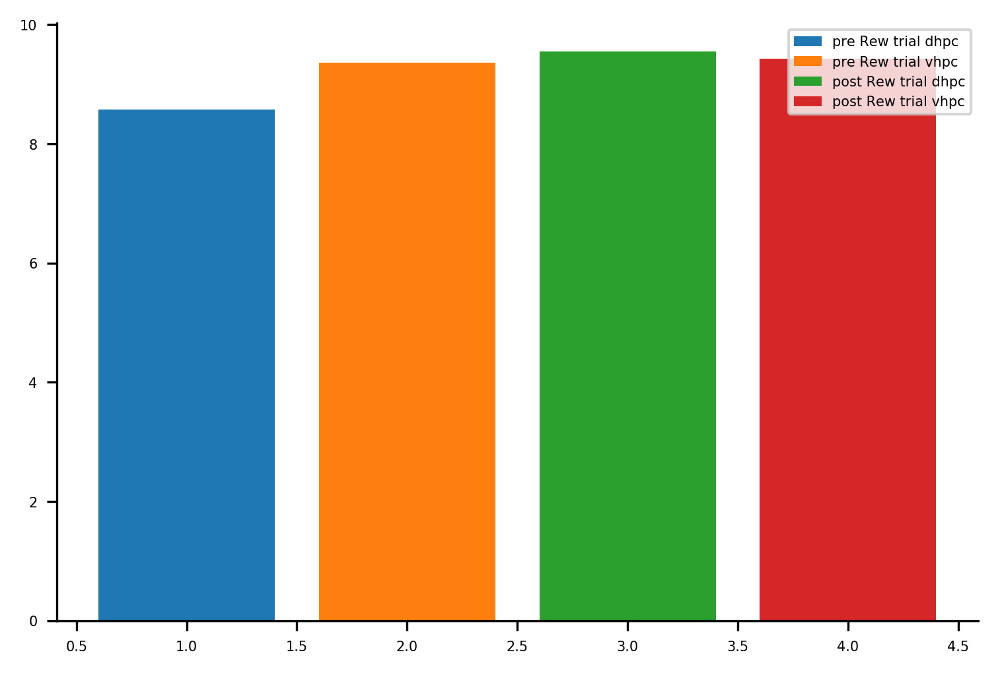

In [137]:
i=0
for sess in 'pre','post':
    for tt in 'Rew',:
        for epoch in 'trial',:
            for reg in 'dhpc','vhpc':
                i=i+1
                pl.bar(i,np.mean(eval("zs_durations_%s_%s_%s_rawB_%s"%(epoch,sess,tt,reg))),label="%s %s %s %s"%(sess,tt,epoch,reg))
                pl.legend()
                #print sess,tt,epoch,reg,'mean:',
                #print np.mean(eval("zs_durations_%s_%s_%s_rawB_%s"%(epoch,sess,tt,reg))), '    StDev:',
                #print np.std(eval("zs_durations_%s_%s_%s_rawB_%s"%(epoch,sess,tt,reg)))

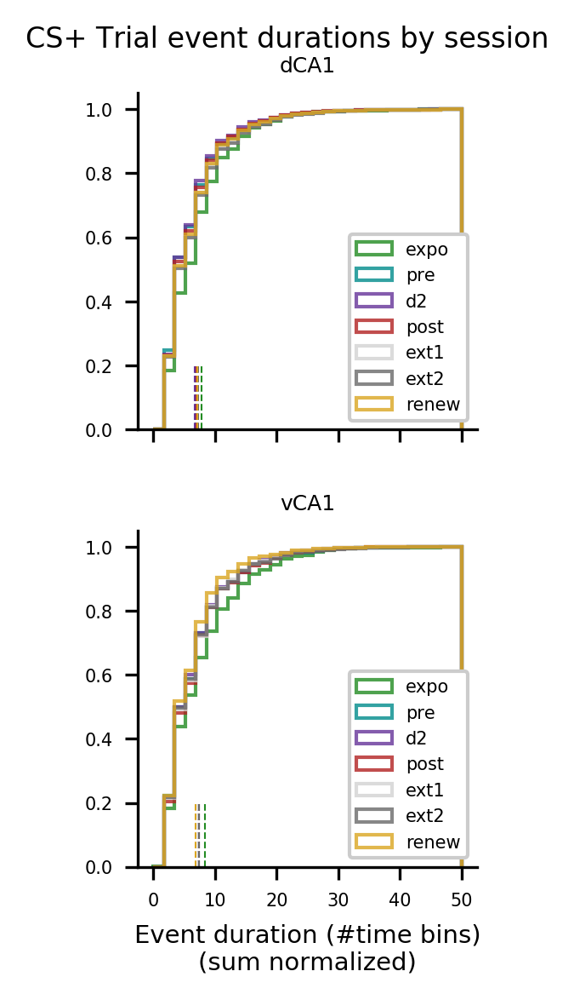

In [92]:
fig, ax = pl.subplots(2,1, figsize=(2,4), sharex=True,sharey=False)
colors = ('forestgreen','darkcyan','rebeccapurple','firebrick','lightgrey','dimgrey','goldenrod')
bins = np.linspace(0, 50, 30)

for i,reg in zip(range(2),['dhpc','vhpc']):
    for x,sess in zip(range(len(sessions)),sessions):
        ax[i].hist(eval("zs_durations_%s_Rew_raw_%s"%(sess,reg)),bins,normed=True, cumulative=True, label=sess,
               histtype='step', alpha=0.8, color=colors[x])
        ax[i].plot([np.mean(eval("zs_durations_%s_Rew_raw_%s"%(sess,reg))),np.mean(eval("zs_durations_%s_Rew_raw_%s"%(sess,reg)))],
                   [0,.2], color=colors[x], lw=.5,ls='--')
        ax[i].legend(loc='lower right',framealpha=1)
        #pl.ylabel('CDF (cells)')
        #ax[x].set_xlim(0,.02)
        #ax[x].invert_xaxis()
        #ax[x].invert_yaxis()
pl.xlabel("Event duration (#time bins)\n(sum normalized)")
ax[0].set_title('dCA1',fontsize=6)
ax[1].set_title('vCA1',fontsize=6)
pl.suptitle("CS+ Trial event durations by session",fontsize=8)
fig.tight_layout(pad=1.5)
#pl.savefig("../img/%s_weights_CDF.jpg"%NOTEBOOK_NAME)

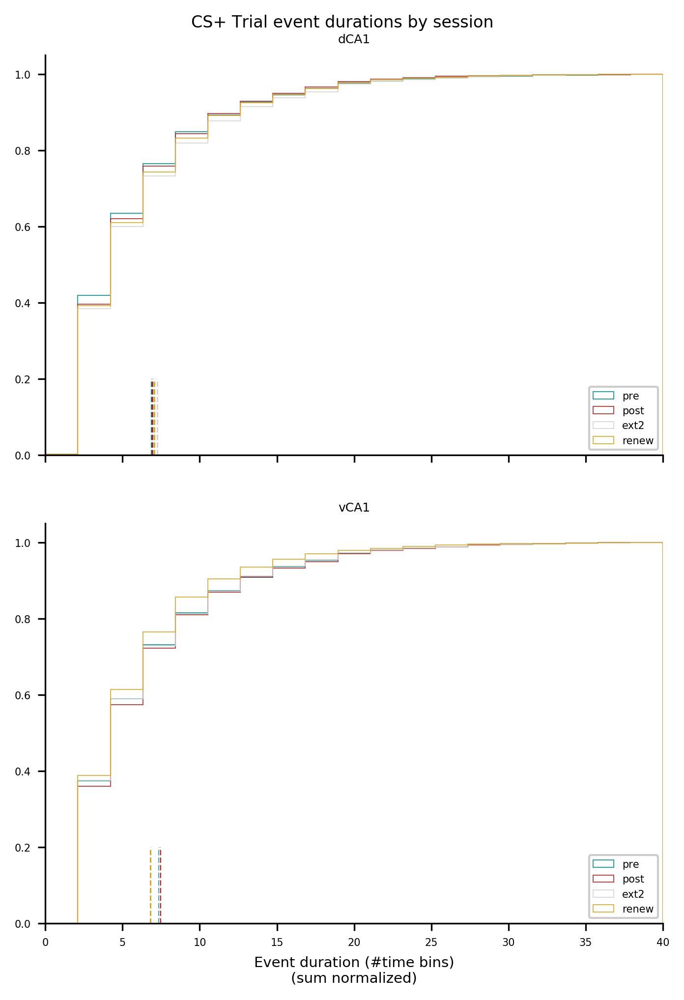

In [115]:
fig, ax = pl.subplots(2,1, figsize=(5,7), sharex=True,sharey=False)
sessb = 'pre','post','ext2','renew'
colorsb = ('darkcyan','firebrick','lightgrey','goldenrod')
bins = np.linspace(0, 40, 20)

for i,reg in zip(range(2),['dhpc','vhpc']):
    for x,sess in zip(range(len(sessb)),sessb):
        ax[i].hist(eval("zs_durations_%s_Rew_raw_%s"%(sess,reg)),bins,normed=True, cumulative=True, label=sess,lw=.5,
               histtype='step', alpha=0.8, color=colorsb[x])
        ax[i].plot([np.mean(eval("zs_durations_%s_Rew_raw_%s"%(sess,reg))),np.mean(eval("zs_durations_%s_Rew_raw_%s"%(sess,reg)))],
                   [0,.2], color=colorsb[x], lw=.7,ls='--')
        ax[i].legend(loc='lower right',framealpha=1)
        #pl.ylabel('CDF (cells)')
        ax[i].set_xlim(0,40)
        #ax[x].invert_xaxis()
        #ax[x].invert_yaxis()
pl.xlabel("Event duration (#time bins)\n(sum normalized)")
ax[0].set_title('dCA1',fontsize=6)
ax[1].set_title('vCA1',fontsize=6)
pl.suptitle("CS+ Trial event durations by session",fontsize=8)
fig.tight_layout(pad=2)
#pl.savefig("../img/%s_weights_CDF.jpg"%NOTEBOOK_NAME)

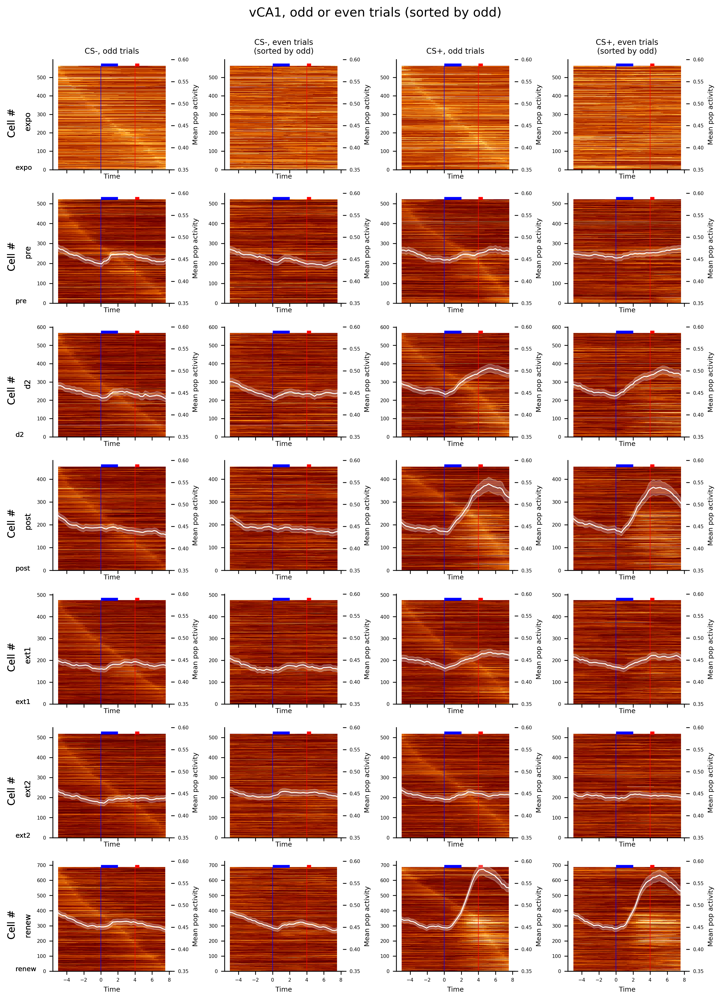

In [124]:
fig, axs = pl.subplots(len(sessions), 4, figsize=(10, np.ceil(all_hms_pre_CSm_traces_vhpc.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,eo,z in zip(['CSm','CSm','Rew','Rew'],['odd','even','odd','even'],range(4)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_vhpc[0]"%sess), eval("min_time_ax_single_%s_vhpc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_traces_vhpc"%(sess,tt)))),vmin=0, vmax=1.5, cmap='afmhot')

        func(axs[i][z], eval("all_hms_%s_%s_traces_%s_vhpc[sort_%s_%s_traces_odd_vhpc]"%(sess,tt,eo,sess,tt)))
        axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][z].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces_vhpc"%sess)), color=['b','r'], lw=.5)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_traces_vhpc"%sess))+5, 0, 2, color='b', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_traces_vhpc"%sess))+5, 4, 4.5, color='r', lw=3)
        axs[i][0].text(-9,len(eval("all_hms_%s_CSm_traces_vhpc"%sess))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-11,len(eval("all_hms_%s_CSm_traces_vhpc"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        twin_ax.plot(eval("min_time_ax_single_%s_vhpc"%sess),eval("all_hms_%s_%s_traces_%s_vhpc.mean(0)"%(sess,tt,eo)),color='w',lw=1)
        m = eval("all_hms_%s_%s_traces_%s_vhpc.mean(0)"%(sess,tt,eo))
        sem = eval("all_hms_%s_%s_traces_%s_vhpc.std(0)/(math.sqrt(len(all_hms_%s_%s_traces_%s_vhpc)))"%(sess,tt,eo,sess,tt,eo))
        twin_ax.fill_between(eval("min_time_ax_single_%s_vhpc"%sess),m-sem,m+sem,alpha=0.25,color='w',linewidth=1)
        twin_ax.set_ylim(0.35,.6)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-, odd trials', fontsize=8)
axs[0][1].set_title('CS-, even trials\n(sorted by odd)', fontsize=8)
axs[0][2].set_title('CS+, odd trials', fontsize=8)
axs[0][3].set_title('CS+, even trials\n(sorted by odd)', fontsize=8)

fig.suptitle("vCA1, odd or even trials (sorted by odd)", fontsize=13, y=1.02)
fig.tight_layout()
fig.savefig('../final-ish figures/%s_sorted_traces_heatmaps_EO_vhpc.pdf'%(NOTEBOOK_NAME))

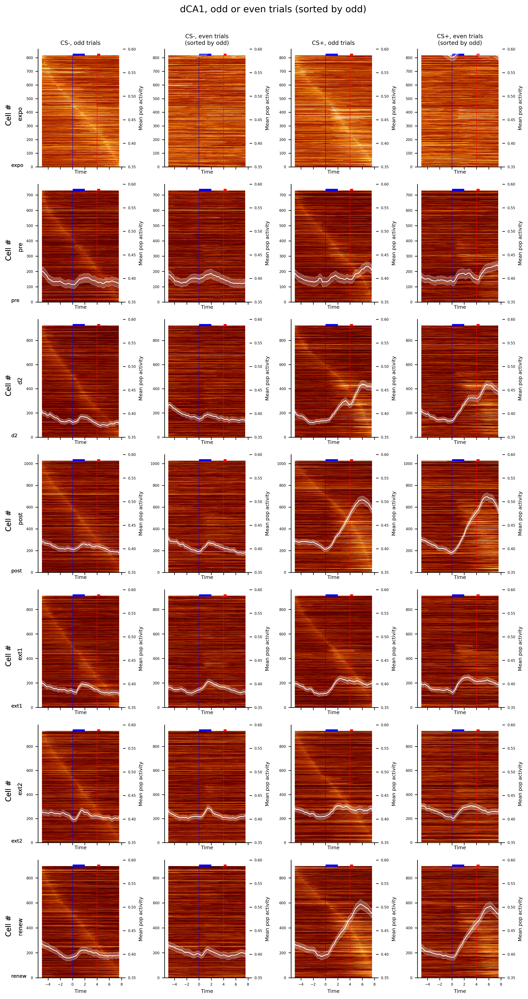

In [123]:
fig, axs = pl.subplots(len(sessions), 4, figsize=(10, np.ceil(all_hms_pre_CSm_traces_dhpc.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,eo,z in zip(['CSm','CSm','Rew','Rew'],['odd','even','odd','even'],range(4)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_dhpc[0]"%sess), eval("min_time_ax_single_%s_dhpc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_traces_dhpc"%(sess,tt)))),vmin=0, vmax=1.5, cmap='afmhot')

        func(axs[i][z], eval("all_hms_%s_%s_traces_%s_dhpc[sort_%s_%s_traces_odd_dhpc]"%(sess,tt,eo,sess,tt)))
        axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][z].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces_dhpc"%sess)), color=['b','r'], lw=.5)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_traces_dhpc"%sess))+5, 0, 2, color='b', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_traces_dhpc"%sess))+5, 4, 4.5, color='r', lw=3)
        axs[i][0].text(-9,len(eval("all_hms_%s_CSm_traces_dhpc"%sess))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-11,len(eval("all_hms_%s_CSm_traces_dhpc"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        twin_ax.plot(eval("min_time_ax_single_%s_dhpc"%sess),eval("all_hms_%s_%s_traces_%s_dhpc.mean(0)"%(sess,tt,eo)),color='w',lw=1)
        m = eval("all_hms_%s_%s_traces_%s_dhpc.mean(0)"%(sess,tt,eo))
        sem = eval("all_hms_%s_%s_traces_%s_dhpc.std(0)/(math.sqrt(len(all_hms_%s_%s_traces_%s_dhpc)))"%(sess,tt,eo,sess,tt,eo))
        twin_ax.fill_between(eval("min_time_ax_single_%s_dhpc"%sess),m-sem,m+sem,alpha=0.25,color='w',linewidth=1)
        twin_ax.set_ylim(0.35,.6)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-, odd trials', fontsize=8)
axs[0][1].set_title('CS-, even trials\n(sorted by odd)', fontsize=8)
axs[0][2].set_title('CS+, odd trials', fontsize=8)
axs[0][3].set_title('CS+, even trials\n(sorted by odd)', fontsize=8)

fig.suptitle("dCA1, odd or even trials (sorted by odd)", fontsize=13, y=1.02)
fig.tight_layout()
fig.savefig('../final-ish figures/%s_sorted_traces_heatmaps_EO_dhpc.pdf'%(NOTEBOOK_NAME))

In [ ]:
Xs = list(np.linspace(-4,4,31))
fig, axs = pl.subplots(len(sessions), 4, figsize=(11, np.ceil(all_hms_pre_CSm_evs.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,eo,z in zip(['CSm','CSm','Rew','Rew'],['baseline','trial','baseline','trial'],range(4)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(-4, 4, 0, len(eval("all_hms_%s_%s_evs"%(sess,tt)))),
                                     vmin=0, vmax=1.5, cmap='afmhot')

        func(axs[i][z], eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))
        axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][0].text(-9,len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-11,len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))/2+10, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        m = list(np.mean(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)),0))
        sem = np.std(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))))
        twin_ax.fill_between(Xs,m-sem,m+sem,alpha=0.4,color='w',linewidth=1)
        #twin_ax.plot(Xs,m,color='w',lw=2)
        twin_ax.set_ylim(0.,.35)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-, pre odor onset', fontsize=8)
axs[0][1].set_title('CS-, post odor onset', fontsize=8)
axs[0][2].set_title('CS+, pre odor onset', fontsize=8)
axs[0][3].set_title('CS+, post odor onset', fontsize=8)

fig.suptitle("dCA1, events", fontsize=13, y=1.02)
fig.tight_layout()
#fig.savefig('../img/%s_evs_heatmaps.jpg'%(NOTEBOOK_NAME))

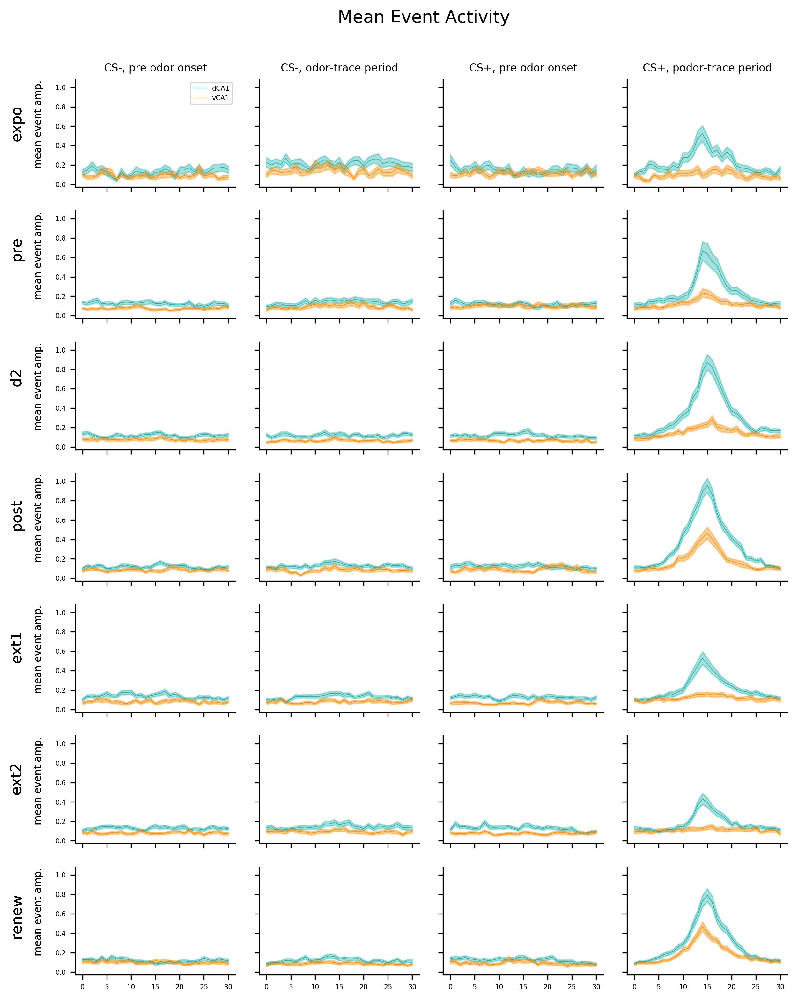

In [222]:
from scipy.stats import norm

Xs = list(np.linspace(0,30,31))
fig, axs = pl.subplots(len(sessions), 4, figsize=(8,10), sharex=True,sharey=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,eo,z in zip(['CSm','CSm','Rew','Rew'],['baseline','trial','baseline','trial'],range(4)):
        exec("gaus_mean_%s_%s_%s_dhpc,gaus_std_%s_%s_%s_dhpc=norm.fit(np.mean(odd_peak_even_PETH_%s_%s_evs_%s_dhpc,0))\
              "%(sess,tt,eo,sess,tt,eo))
        exec("gaus_mean_%s_%s_%s_vhpc,gaus_std_%s_%s_%s_vhpc=norm.fit(np.mean(odd_peak_even_PETH_%s_%s_evs_%s_vhpc,0))\
              "%(sess,tt,eo,sess,tt,eo))
        
        d = list(np.mean(eval("odd_peak_even_PETH_%s_%s_evs_%s_dhpc"%(sess,tt,eo)),0))
        v = list(np.mean(eval("odd_peak_even_PETH_%s_%s_evs_%s_vhpc"%(sess,tt,eo)),0))
        d_sem = np.std(eval("odd_peak_even_PETH_%s_%s_evs_%s_dhpc"%(sess,tt,eo)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_%s_evs_%s_dhpc"%(sess,tt,eo)))))
        v_sem = np.std(eval("odd_peak_even_PETH_%s_%s_evs_%s_vhpc"%(sess,tt,eo)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_%s_evs_%s_vhpc"%(sess,tt,eo)))))
        axs[i][z].plot(d,color='lightseagreen',label='dCA1')
        axs[i][z].plot(v,color='darkorange',label='vCA1')
        axs[i][z].fill_between(Xs,d-d_sem,d+d_sem,alpha=0.4,color='lightseagreen',linewidth=1)
        axs[i][z].fill_between(Xs,v-v_sem,v+v_sem,alpha=0.4,color='darkorange',linewidth=1)
        axs[i][0].text(-15,0.7, sess, fontsize=11,rotation=90)
        axs[i][0].text(-10,1, 'mean event amp.', fontsize=7.5,rotation=90)
axs[0][0].legend()
        #axs[i][z].set_xlabel("Time")
        #axs[i][0].text(-9,len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))/2, sess, fontsize=8, rotation=90)
        #axs[i][0].text(-11,len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))/2+10, "Cell #", fontsize=10, rotation=90)
        #twin_ax = axs[i][z].twinx()
        #twin_ax.set_ylabel("Mean pop activity")
        #m = list(np.mean(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)),0))
        #sem = np.std(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))))
        #twin_ax.fill_between(Xs,m-sem,m+sem,alpha=0.4,color='w',linewidth=1)
        ##twin_ax.plot(Xs,m,color='w',lw=2)
        #twin_ax.set_ylim(0.,.35)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-, pre odor onset', fontsize=8)
axs[0][1].set_title('CS-, odor-trace period', fontsize=8)
axs[0][2].set_title('CS+, pre odor onset', fontsize=8)
axs[0][3].set_title('CS+, podor-trace period', fontsize=8)

fig.suptitle("Mean Event Activity", fontsize=13, y=1.04)
fig.tight_layout()
fig.savefig('../final-ish figures/%s_mean_PETH.pdf'%(NOTEBOOK_NAME))

In [238]:
from scipy.stats import norm

#data = np.random.normal(loc=5.0, scale=2.0, size=1000)
#mean,std=norm.fit(data)
#for sess in sessions:
#    for tt in 'CSm','Rew':
gaus_mean_dhpc,gaus_std_dhpc=norm.fit(np.mean(odd_peak_even_PETH_post_Rew_evs_trial_dhpc,0))
gaus_mean_vhpc,gaus_std_vhpc=norm.fit(np.mean(odd_peak_even_PETH_post_Rew_evs_trial_vhpc,0))
x = np.linspace(0, 30, 31)
d_gaus = norm.pdf(x,gaus_mean_dhpc,gaus_std_dhpc)
print gaus_mean_dhpc,gaus_std_dhpc
print gaus_mean_vhpc,gaus_std_vhpc
print np.mean(odd_peak_even_PETH_post_Rew_evs_trial_dhpc,0)
print d_gaus

0.350339330901 0.258205342872
0.180594269945 0.109981403239
[ 0.11382295  0.11499483  0.10813334  0.1208119   0.12989071  0.14007712
  0.16624331  0.22934357  0.26463972  0.3276553   0.45918427  0.524586
  0.65037929  0.75243958  0.88896248  0.9587785   0.86113082  0.67172623
  0.54985473  0.48251179  0.41213948  0.36627658  0.31566313  0.20711785
  0.20447369  0.1781336   0.19020155  0.12837472  0.12842939  0.11604235
  0.09850048]
[  6.15435726e-001   6.52047740e-002   2.11487387e-009   2.09989672e-023
   6.38292567e-044   5.93950189e-071   1.69195438e-104   1.47548793e-144
   3.93904607e-191   3.21925105e-244   8.05428547e-304   0.00000000e+000
   0.00000000e+000   0.00000000e+000   0.00000000e+000   0.00000000e+000
   0.00000000e+000   0.00000000e+000   0.00000000e+000   0.00000000e+000
   0.00000000e+000   0.00000000e+000   0.00000000e+000   0.00000000e+000
   0.00000000e+000   0.00000000e+000   0.00000000e+000   0.00000000e+000
   0.00000000e+000   0.00000000e+000   0.00000000e+0

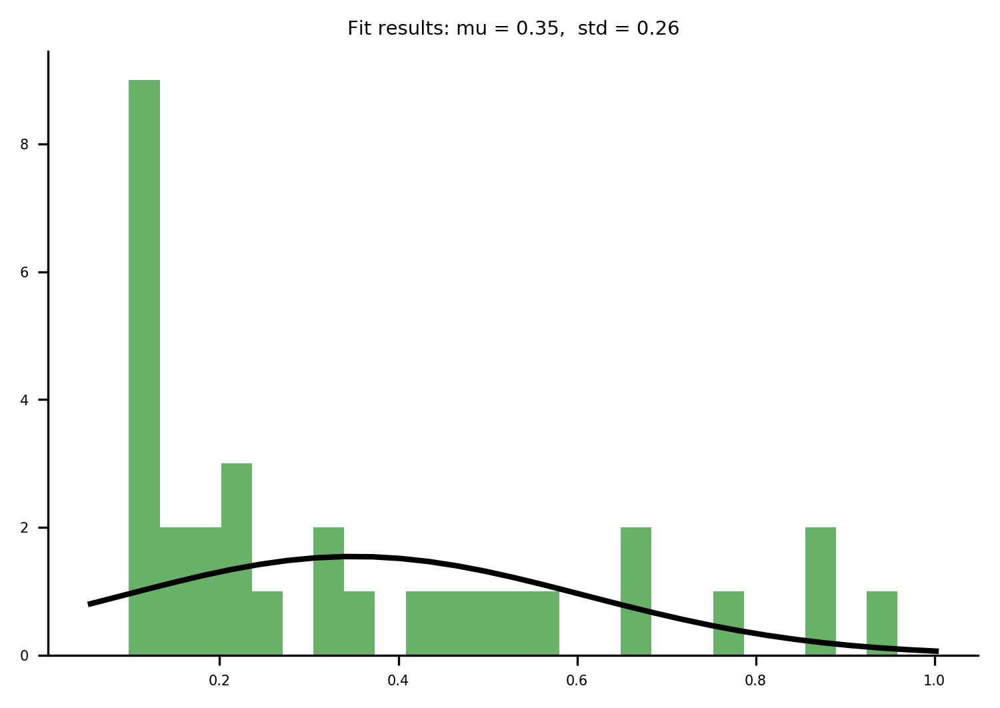

In [244]:
from scipy.stats import norm


# Generate some data for this demonstration.
data = np.mean(odd_peak_even_PETH_post_Rew_evs_trial_dhpc,0)

# Fit a normal distribution to the data:
mu, std = norm.fit(data)

# Plot the histogram.
pl.hist(data, bins=25, alpha=0.6, color='g')

# Plot the PDF.
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 31)
p = norm.pdf(x, mu, std)
pl.plot(x, p, 'k', linewidth=2)
title = "Fit results: mu = %.2f,  std = %.2f" % (mu, std)
pl.title(title)

pl.show()

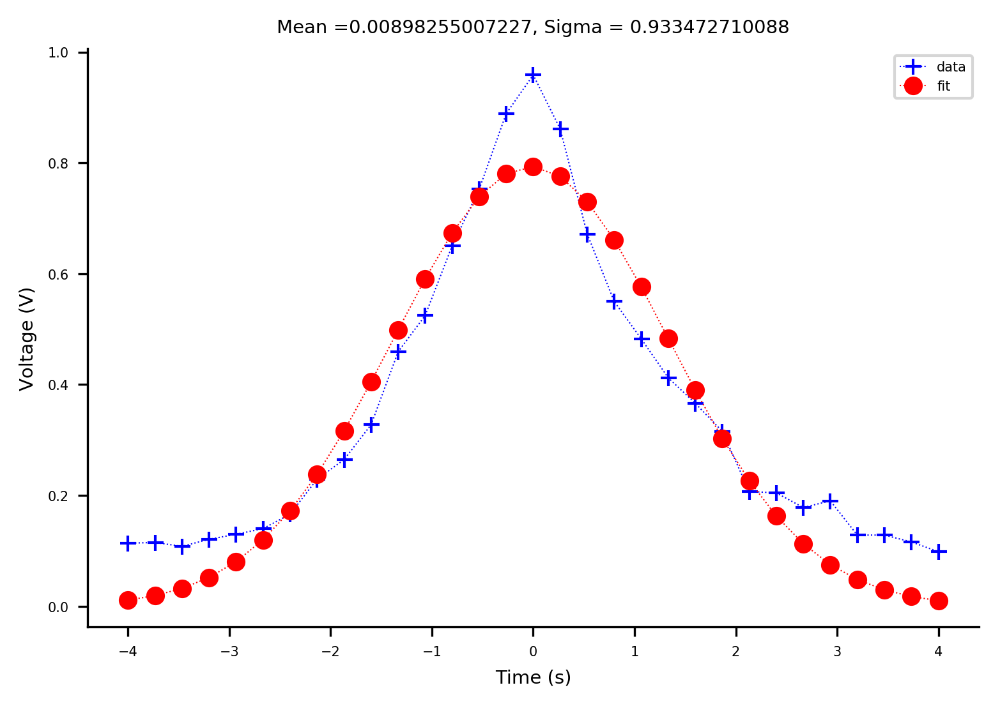

In [259]:
from scipy.optimize import curve_fit
from scipy import asarray as ar,exp
from __future__ import division


x = np.linspace(-4,4,31)
y = np.mean(odd_peak_even_PETH_post_Rew_evs_trial_dhpc,0)

n = len(x)                          #the number of data
mean = sum(x*y)/n                   #note this correction
sigma = sum(y*(x-mean)**2)/n        #note this correction

def gaus(x,a,x0,sigma):
    return a*exp(-(x-x0)**2/(2*sigma**2))

popt,pcov = curve_fit(gaus,x,y,p0=[1,mean,sigma])

plt.plot(x,y,'b+:',label='data')
plt.plot(x,gaus(x,*popt),'ro:',label='fit')
plt.legend()
plt.title("Mean ="+str(mean)+", Sigma = "+str(sigma))
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.show()

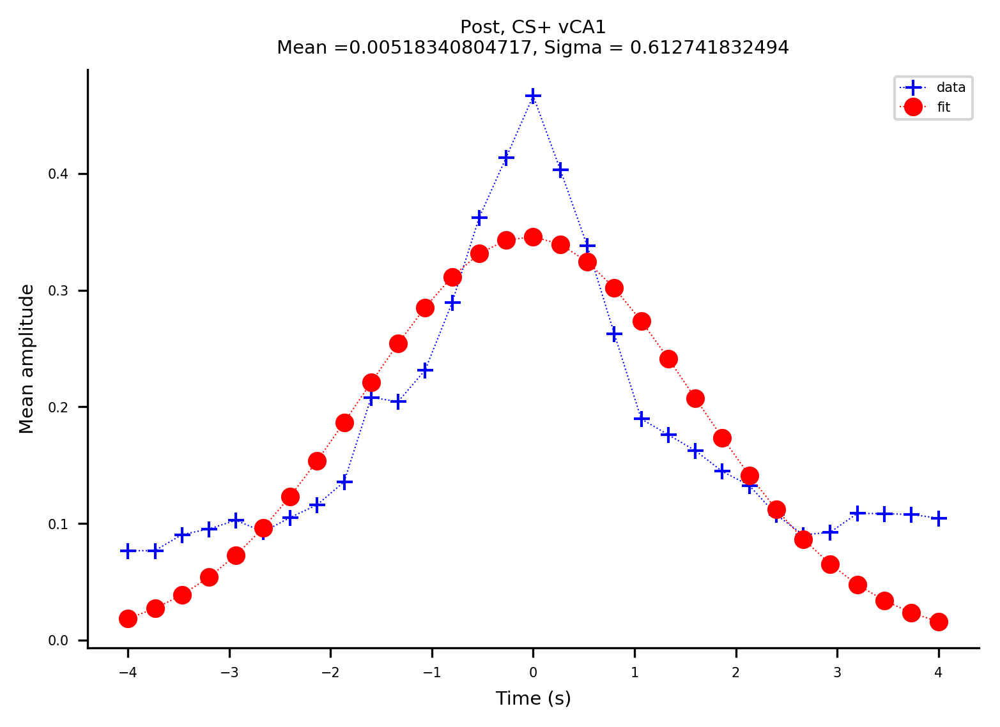

In [261]:
from scipy.optimize import curve_fit
from scipy import asarray as ar,exp

x = np.linspace(-4,4,31)
y = np.mean(odd_peak_even_PETH_post_Rew_evs_trial_vhpc,0)

n = len(x)                          #the number of data
mean = sum(x*y)/n                   #note this correction
sigma = sum(y*(x-mean)**2)/n        #note this correction

def gaus(x,a,x0,sigma):
    return a*exp(-(x-x0)**2/(2*sigma**2))

popt,pcov = curve_fit(gaus,x,y,p0=[1,mean,sigma])

plt.plot(x,y,'b+:',label='data')
plt.plot(x,gaus(x,*popt),'ro:',label='fit')
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Mean amplitude')
plt.title("Post, CS+ vCA1\nMean ="+str(mean)+", Sigma = "+str(sigma))
plt.show()

In [262]:
y = np.mean(odd_peak_even_PETH_post_Rew_evs_trial_vhpc,0)
print y

[ 0.07667683  0.07694899  0.09056901  0.09543726  0.10288895  0.09289516
  0.10517501  0.11611881  0.13579747  0.20806901  0.20449901  0.23153989
  0.2894564   0.36214092  0.41368011  0.46632272  0.40333556  0.33803115
  0.26276444  0.18966535  0.17611685  0.16255715  0.14475218  0.13267538
  0.10757334  0.09030511  0.0926486   0.10874473  0.10851914  0.10785578
  0.10466207]


In [264]:
np.savetxt('odd_peak_even_PETH_post_Rew_evs_trial_dhpc.csv',np.mean(odd_peak_even_PETH_post_Rew_evs_trial_dhpc,0), delimiter=',')

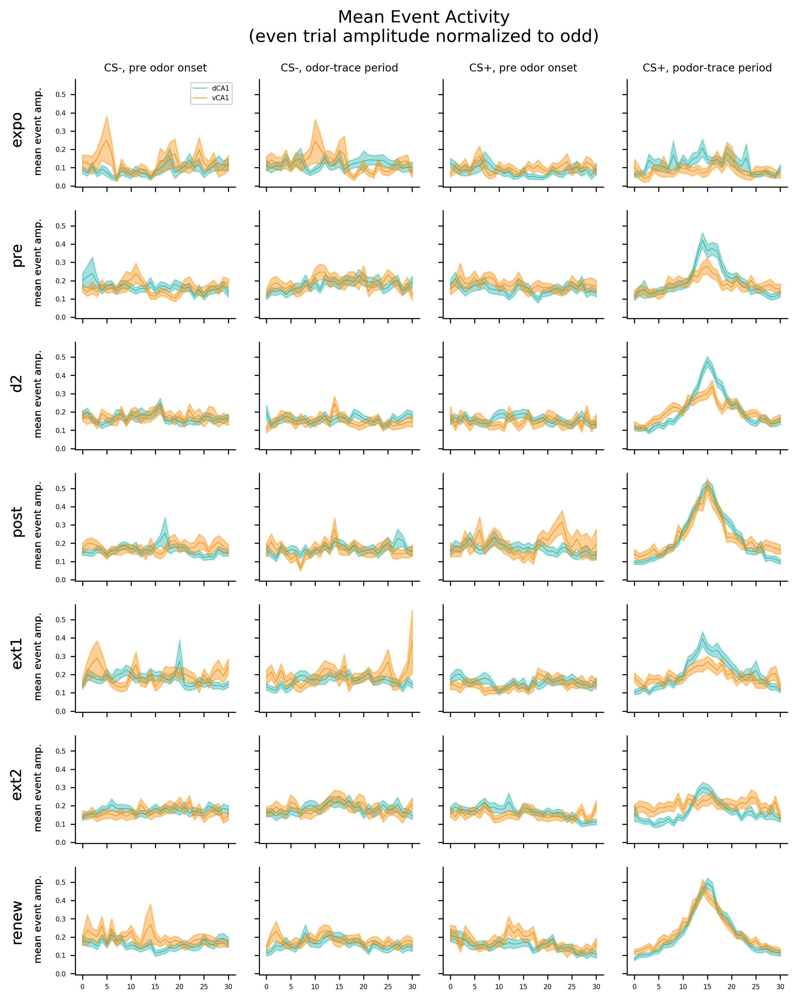

In [223]:
Xs = list(np.linspace(0,30,31))
fig, axs = pl.subplots(len(sessions), 4, figsize=(8,10), sharex=True,sharey=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,eo,z in zip(['CSm','CSm','Rew','Rew'],['baseline','trial','baseline','trial'],range(4)):
        d = list(np.mean(eval("odd_peak_even_PETH_%s_%s_evs_normed_%s_dhpc"%(sess,tt,eo)),0))
        v = list(np.mean(eval("odd_peak_even_PETH_%s_%s_evs_normed_%s_vhpc"%(sess,tt,eo)),0))
        d_sem = np.std(eval("odd_peak_even_PETH_%s_%s_evs_normed_%s_dhpc"%(sess,tt,eo)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_%s_evs_normed_%s_dhpc"%(sess,tt,eo)))))
        v_sem = np.std(eval("odd_peak_even_PETH_%s_%s_evs_normed_%s_vhpc"%(sess,tt,eo)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_%s_evs_normed_%s_vhpc"%(sess,tt,eo)))))
        axs[i][z].plot(d,color='lightseagreen',label='dCA1')
        axs[i][z].plot(v,color='darkorange',label='vCA1')
        axs[i][z].fill_between(Xs,d-d_sem,d+d_sem,alpha=0.4,color='lightseagreen',linewidth=1)
        axs[i][z].fill_between(Xs,v-v_sem,v+v_sem,alpha=0.4,color='darkorange',linewidth=1)
        axs[i][0].text(-15,0.35, sess, fontsize=11,rotation=90)
        axs[i][0].text(-10,0.5, 'mean event amp.', fontsize=7.5,rotation=90)
axs[0][0].legend()
        #axs[i][z].set_xlabel("Time")
        #axs[i][0].text(-9,len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))/2, sess, fontsize=8, rotation=90)
        #axs[i][0].text(-11,len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))/2+10, "Cell #", fontsize=10, rotation=90)
        #twin_ax = axs[i][z].twinx()
        #twin_ax.set_ylabel("Mean pop activity")
        #m = list(np.mean(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)),0))
        #sem = np.std(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))))
        #twin_ax.fill_between(Xs,m-sem,m+sem,alpha=0.4,color='w',linewidth=1)
        ##twin_ax.plot(Xs,m,color='w',lw=2)
        #twin_ax.set_ylim(0.,.35)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-, pre odor onset', fontsize=8)
axs[0][1].set_title('CS-, odor-trace period', fontsize=8)
axs[0][2].set_title('CS+, pre odor onset', fontsize=8)
axs[0][3].set_title('CS+, podor-trace period', fontsize=8)

fig.suptitle("Mean Event Activity\n(even trial amplitude normalized to odd)", fontsize=13, y=1.04)
fig.tight_layout()
fig.savefig('../final-ish figures/%s_mean_normed_PETH.pdf'%(NOTEBOOK_NAME))

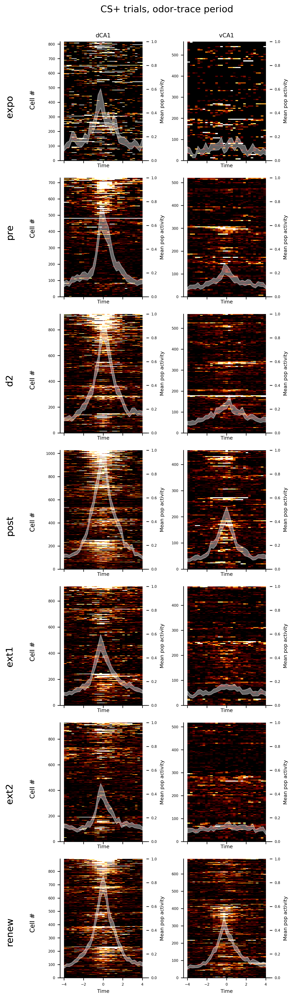

In [212]:
Xs = list(np.linspace(-4,4,31))
fig, axs = pl.subplots(len(sessions), 2, figsize=(5, np.ceil(all_hms_pre_CSm_evs_dhpc.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for reg,z in zip(['dhpc','vhpc'],range(2)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(-4, 4, 0, len(eval("all_hms_%s_Rew_evs_%s"%(sess,reg)))),
                                     vmin=0, vmax=1.5, cmap='afmhot')

        func(axs[i][z], eval("odd_peak_even_PETH_%s_Rew_evs_trial_%s"%(sess,reg)))
        axs[i][0].text(-10,400, sess, fontsize=13,rotation=90)
        axs[i][z].set_xlabel("Time")
        #axs[i][0].text(-9,len(eval("odd_peak_even_PETH_%s_Rew_evs_trial_%s"%(sess,reg)))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-7.5,450, "Cell #", fontsize=9, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        m = list(np.mean(eval("odd_peak_even_PETH_%s_Rew_evs_trial_%s"%(sess,reg)),0))
        sem = np.std(eval("odd_peak_even_PETH_%s_Rew_evs_trial_%s"%(sess,reg)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_Rew_evs_trial_%s"%(sess,reg)))))
        twin_ax.fill_between(Xs,m-sem,m+sem,alpha=0.4,color='w',linewidth=1)
        #twin_ax.plot(Xs,m,color='w',lw=2)
        twin_ax.set_ylim(0.,1)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('dCA1', fontsize=8)
axs[0][1].set_title('vCA1', fontsize=8)

fig.suptitle("CS+ trials, odor-trace period", fontsize=13, y=1.02)
fig.tight_layout()
fig.savefig('../final-ish figures/%s_PETH_heatmap_CSp_postOdor.pdf'%(NOTEBOOK_NAME))

In [233]:
test = np.mean(odd_peak_even_PETH_post_Rew_evs_normed_trial_vhpc,0)
print test

[ 0.14241452  0.12491341  0.13496428  0.1464508   0.17091214  0.13563654
  0.15543306  0.1688772   0.17774974  0.26990924  0.23812792  0.28485428
  0.33787334  0.41864772  0.41283192  0.51341506  0.43334002  0.38822199
  0.34172936  0.23131477  0.2332324   0.22190287  0.19588731  0.18926892
  0.20810614  0.17605954  0.17045499  0.19144892  0.18272828  0.17178428
  0.16466303]


In [213]:
save_workspace(db)

Could not store variable 'IPython'. Skipping...
Could not store variable 'sstats'. Skipping...
Could not store variable 'pickle'. Skipping...
Could not store variable 'fig'. Skipping...
Could not store variable 'math'. Skipping...
Could not store variable 'twin_ax'. Skipping...
Could not store variable 'axs'. Skipping...
Could not store variable 'pt'. Skipping...
Could not store variable 'pl'. Skipping...
Could not store variable 'func'. Skipping...
Could not store variable 'ip'. Skipping...
Could not store variable 'sys'. Skipping...
Could not store variable 'os'. Skipping...
Could not store variable 'ut'. Skipping...
Could not store variable 'np'. Skipping...
